# <center>Implementing LDA in Python</center>

## Key Concepts in this Notebook

## Introduction

In [2]:
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')

# You'll be prompted to go to a URL and obtain an authorization code. Follow the instructions and paste the code in the input field.

# Your Google Drive will be mounted at '/content/drive', and you can access it in your Colab notebooks.


Mounted at /content/drive


In [1]:
import spacy
import pandas as pd
import os

directory_path = r"C:\Users\Najeeb\Desktop\SIT Semesters\Sem 5\LAWWWWWWWWWWWWWWWWW\Dataset\nv3"

# Function to extract text between two patterns
def extract_text_between_patterns(text, start_pattern, end_pattern):
    start_index = text.find(start_pattern)
    end_index = text.find(end_pattern)
    if start_index != -1 and end_index != -1:
        return text[start_index + len(start_pattern):end_index]
    else:
        return None

# Create lists to store data
case_names = []
committee_members_list = []
procedure_info_list = []
facts_info_list = []
law_info_list = []
judgment_info_list = []

# Loop through text files
for i in range(1, 300):  # Assuming you have files named 1.txt to 560.txt
    filename = f"{i}.txt"
    file_path = os.path.join(directory_path, filename)

    with open(file_path, 'r', encoding='utf-8') as file:
        text = file.read()

    case_name = extract_text_between_patterns(text, "In the case of ", ",")
    committee_members = extract_text_between_patterns(text, ":", "Having deliberated")
    procedure_info = extract_text_between_patterns(text, "PROCEDURE", "THE FACTS")
    facts_info = extract_text_between_patterns(text, "THE FACTS", "THE LAW")
    law_info = extract_text_between_patterns(text, "THE LAW", "FOR THESE REASONS")
    judgment_info = extract_text_between_patterns(text, "FOR THESE REASONS", "Done in")

    # Append data to lists
    case_names.append(case_name)
    committee_members_list.append(committee_members)
    procedure_info_list.append(procedure_info)
    facts_info_list.append(facts_info)
    law_info_list.append(law_info)
    judgment_info_list.append(judgment_info)

# Create the DataFrame
df = pd.DataFrame({
    'Case Name': case_names,
    'Committee Members': committee_members_list,
    'PROCEDURE': procedure_info_list,
    'THE FACTS': facts_info_list,
    'THE LAW': law_info_list,
    'Judgment': judgment_info_list
})


In [2]:
import re
import pandas as pd

def clean_text(text, patterns_to_remove):
    # Create a regular expression pattern by joining the provided patterns with '|'
    pattern = '|'.join(re.escape(pat) for pat in patterns_to_remove)

    # Remove the specified patterns except single newlines '\n'
    cleaned_text = re.sub(pattern, '', text)
    cleaned_text = re.sub(r'(\d+\.\s*)', ' ', cleaned_text)  # Remove digits and dots
    cleaned_text = re.sub(r'(\n{2,})', ' ', cleaned_text)  # Replace multiple newlines with a single space
    return cleaned_text.strip()  # Strip leading/trailing spaces


df['Case Name'] = df['Case Name'].astype(str)
df['PROCEDURE'] = df['PROCEDURE'].astype(str)
df['THE FACTS'] = df['THE FACTS'].astype(str)
df['THE LAW'] = df['THE LAW'].astype(str)
df['Judgment'] = df['Judgment'].astype(str)
# Apply the clean_text function to the 'procedure' column
df['Case Name'] = df['Case Name'].apply(lambda x: clean_text(x, ['\n\n', '\n']))
df['Committee Members'] = df['Committee Members'].apply(lambda x: clean_text(x, ['\n\n', '\n']))
df['PROCEDURE'] = df['PROCEDURE'].apply(lambda x: clean_text(x, ['\n\n', '\n']))
df['THE FACTS'] = df['THE FACTS'].apply(lambda x: clean_text(x, ['\n\n', '\n']))
df['THE LAW'] = df['THE LAW'].apply(lambda x: clean_text(x, ['\n\n', '\n']))
df['Judgment'] = df['Judgment'].apply(lambda x: clean_text(x, ['\n\n', '\n']))

# Print the cleaned DataFrame
# df.head()


In [3]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop = stopwords.words('english')

def remove_starting_comma(text):
    return re.sub(r'^, ', '', text)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Najeeb\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
columns_to_clean = ['Case Name', 'Committee Members', 'PROCEDURE', 'THE FACTS', 'THE LAW', 'Judgment']

df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: clean_text(x, ['\n\n', '\n']))
df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: x.lower())
df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: re.sub("'", '', x))
df['Judgment'] = df['Judgment'].apply(remove_starting_comma)
# df[columns_to_clean] = df[columns_to_clean].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
# df[columns_to_clean] = df[columns_to_clean].apply(lambda x: re.sub("'", '', x))

C:\Users\Najeeb\AppData\Local\Temp\ipykernel_29748\1793284914.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: clean_text(x, ['\n\n', '\n']))
C:\Users\Najeeb\AppData\Local\Temp\ipykernel_29748\1793284914.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: x.lower())
C:\Users\Najeeb\AppData\Local\Temp\ipykernel_29748\1793284914.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_clean] = df[columns_to_clean].applymap(lambda x: re.sub("'", '', x))


In [5]:
data = df

# data['THE FACTS'] = data['THE FACTS'].astype(str)
# data['THE LAW'] = data['THE LAW'].astype(str)
data['THE FACTS'] = data['THE FACTS'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)
data['THE LAW'] = data['THE LAW'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# Combine input columns (e.g., 'PROCEDURE', 'THE FACTS', 'THE LAW') into a single text column
# data['input_text'] = data['PROCEDURE'] + ' ' + data['THE FACTS'] + ' ' + data['THE LAW']
data['input_text'] = data['THE FACTS'] + ' ' + data['THE LAW']


# Ensure all values in 'input_text' are strings
data['input_text'] = data['input_text'].astype(str)

df = data

## Importing the Required Libraries

In [6]:
#https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#1introduction
import numpy as np
import json
import glob

#Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

#spacy
import spacy
from nltk.corpus import stopwords

#vis
import pyLDAvis
import pyLDAvis.gensim

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# YTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT

## Preparing the Data

In [7]:
stopwords = stopwords.words("english")

In [8]:
print (stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [9]:
data = df['input_text']

In [10]:
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)


lemmatized_texts = lemmatization(data)

In [11]:
data

0      i.  the circumstances of the case the applican...
1      i.  the circumstances of the case the applican...
2      i.  the circumstances of the case the applican...
3      i.  the circumstances of the case the applican...
4      i.  the circumstances of the case the applican...
                             ...                        
294    i.  the circumstances of the case the facts of...
295    i.  the circumstances of the case the applican...
296    i.  the circumstances of the case the applican...
297    i.  the circumstances of the case the applican...
298    i.  the circumstances of the case the applican...
Name: input_text, Length: 299, dtype: object

In [12]:
print(lemmatized_texts)

['circumstance case applicant bear detain approximately a.m. applicant place pre - trial detention budapest prison transport premise budap main police department questioning accompany guard hand question a.m. show sign injury questioning start approximately a.m. last approximately a.m. conduct police officer b applicant choose give statement release interrogation applicant hand guard budapest prison presence police officer ask ill treat applicant declare transport back budapest prison applicant undergo medical examination readmission claim ill treat police officer a. certain injury note applicant report draw incident photo take injury right medical examination applicant again transport budap main police department questioning take military hospital police officer conduct interrogation allegedly assault hospital examine presence police officer medical report note bleed low lip jaw sensitive pressure bruise rib all likely heal day accord applicant submission follow return prison again su

In [13]:
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

data_words = gen_words(lemmatized_texts)

print (data_words[0][0:20])

['circumstance', 'case', 'applicant', 'bear', 'detain', 'approximately', 'applicant', 'place', 'pre', 'trial', 'detention', 'budapest', 'prison', 'transport', 'premise', 'budap', 'main', 'police', 'department', 'questioning']


In [20]:
#BIGRAMS AND TRIGRAMS
bigram_phrases = gensim.models.Phrases(data_words, min_count=5, threshold=50)
trigram_phrases = gensim.models.Phrases(bigram_phrases[data_words], threshold=50)

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)

def make_bigrams(texts):
    return([bigram[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram[bigram[doc]] for doc in texts])

data_bigrams = make_bigrams(data_words)
data_bigrams_trigrams = make_trigrams(data_bigrams)

print (data_bigrams_trigrams[0][0:20])

['circumstance', 'case', 'applicant', 'bear', 'detain', 'approximately', 'applicant', 'place', 'pre_trial_detention', 'budapest', 'prison', 'transport', 'premise', 'budap', 'main', 'police', 'department', 'questioning', 'accompany', 'guard']


In [21]:
#TF-IDF REMOVAL
from gensim.models import TfidfModel

id2word = corpora.Dictionary(data_bigrams_trigrams)

texts = data_bigrams_trigrams

corpus = [id2word.doc2bow(text) for text in texts]
# print (corpus[0][0:20])

tfidf = TfidfModel(corpus, id2word=id2word)

low_value = 0.03
words  = []
words_missing_in_tfidf = []
for i in range(0, len(corpus)):
    bow = corpus[i]
    low_value_words = [] #reinitialize to be safe. You can skip this.
    tfidf_ids = [id for id, value in tfidf[bow]]
    bow_ids = [id for id, value in bow]
    low_value_words = [id for id, value in tfidf[bow] if value < low_value]
    drops = low_value_words+words_missing_in_tfidf
    for item in drops:
        words.append(id2word[item])
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids] # The words with tf-idf socre 0 will be missing

    new_bow = [b for b in bow if b[0] not in low_value_words and b[0] not in words_missing_in_tfidf]
    corpus[i] = new_bow

In [24]:
# id2word = corpora.Dictionary(data_words)

# corpus = []
# for text in data_words:
#     new = id2word.doc2bow(text)
#     corpus.append(new)

# print (corpus[0][0:20])

# word = id2word[[0][:1][0]]
# print (word)

[(0, 1), (1, 26), (2, 1), (3, 3), (4, 1), (5, 1), (6, 1), (7, 3), (8, 10), (9, 1), (10, 6), (11, 2), (12, 2), (13, 1), (14, 2), (15, 2), (16, 4), (17, 1), (18, 1), (19, 1)]
ability


In [32]:
# lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
#                                            id2word=id2word,
#                                            num_topics=12,
#                                            random_state=100,
#                                            update_every=1,
#                                            chunksize=100,
#                                            passes=10,
#                                            alpha="auto")


In [36]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus[:-1],
                                        id2word=id2word,
                                        num_topics=15,
                                        random_state=100,
                                        update_every=1,
                                        chunksize=100,
                                        passes=10,
                                        alpha="auto")

coherence_model_lda = CoherenceModel(model=lda_model, texts=corpus, dictionary=id2word, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()
    
coherence_score

nan

# YTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT

In [14]:
import gensim
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import numpy as np


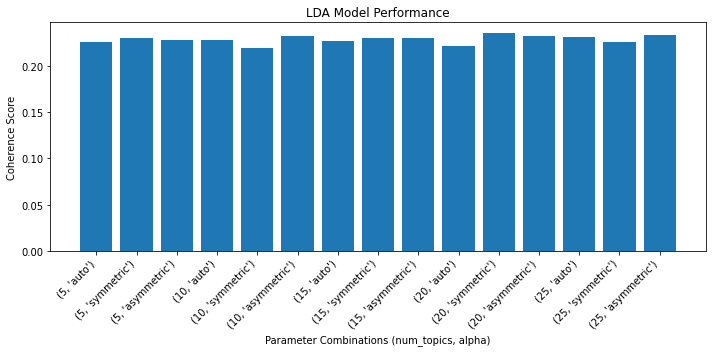

In [37]:
import gensim
from gensim.models import CoherenceModel
import pandas as pd
from gensim import corpora

# Assuming 'df' contains your DataFrame with a column 'input_text'
data = df['input_text']

# Tokenize the text data
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return final

data_words = gen_words(data)

# Create bigrams and trigrams
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

data_bigrams_trigrams = make_trigrams(data_words)

# Create a dictionary and a corpus
id2word = corpora.Dictionary(data_bigrams_trigrams)
corpus = [id2word.doc2bow(text) for text in data_bigrams_trigrams]

# Define a function to calculate coherence scores for different LDA models
def calculate_coherence(corpus, id2word, num_topics, alpha, passes):
    lda_model = gensim.models.LdaModel(
        corpus=corpus,
        id2word=id2word,
        num_topics=num_topics,
        alpha=alpha,
        passes=passes
    )
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_bigrams_trigrams, dictionary=id2word, coherence='c_v')
    coherence_score = coherence_model_lda.get_coherence()
    
    return coherence_score

# Define the parameter values you want to experiment with
num_topics_values = [5, 10, 15, 20, 25]
alpha_values = ['auto', 'symmetric', 'asymmetric']

# Initialize empty lists to store the results
coherence_scores = []
parameter_combinations = []

# Iterate through different combinations of parameter values
for num_topics in num_topics_values:
    for alpha in alpha_values:
        try:
            coherence_score = calculate_coherence(corpus, id2word, num_topics, alpha, passes=10)
            if not pd.isna(coherence_score):
                coherence_scores.append(coherence_score)
                parameter_combinations.append((num_topics, alpha))
        except Exception as e:
            print(f"Error calculating coherence for ({num_topics}, '{alpha}'): {e}")

# Create a plot to visualize the results
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(len(coherence_scores))
plt.figure(figsize=(10, 5))
plt.bar(x, coherence_scores, tick_label=[f"({num}, '{alpha}')" for num, alpha in parameter_combinations])
plt.xlabel("Parameter Combinations (num_topics, alpha)")
plt.ylabel("Coherence Score")
plt.title("LDA Model Performance")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [39]:
max(coherence_scores)

0.23506440316357188

In [40]:
coherence_scores

[0.22524329614194044,
 0.22952677793728346,
 0.2277293761746066,
 0.22740359448035025,
 0.2189672478037819,
 0.23244387843911635,
 0.22667187238674463,
 0.23010872439190638,
 0.2297366678175323,
 0.22136402906634062,
 0.23506440316357188,
 0.23252306006714907,
 0.23119287891883566,
 0.22588936164102133,
 0.23318113705816806]

In [ ]:
import gensim
from gensim import corpora
from gensim.models import LdaModel
import pandas as pd

# Assuming 'df' contains your DataFrame with a column 'input_text'
data = df['input_text']

# Tokenize the text data
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return final

data_words = gen_words(data)

# Create bigrams and trigrams
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=50)
trigram = gensim.models.Phrases(bigram[data_words], threshold=50)
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

data_bigrams_trigrams = make_trigrams(data_words)

# Create a dictionary and a corpus
id2word = corpora.Dictionary(data_bigrams_trigrams)
corpus = [id2word.doc2bow(text) for text in data_bigrams_trigrams]

# Train the LDA model
num_topics = 10  # Adjust as needed
alpha_values = "symmetric"
lda_model = LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, alpha_values=alpha_values)

# Now you have trained the LDA model. You can save it if needed:
lda_model.save(r"C:\Users\Najeeb\Desktop\SIT Semesters\Sem 5\LAWWWWWWWWWWWWWWWWW\FINAL CODES\model of topic modelling\test_model.model")

In [ ]:

# Perform topic inference on a new corpus
new_data = ["Your new documents go here."]  # Add your new text data

# Tokenize and preprocess new data
new_data_words = gen_words(new_data)
new_data_bigrams_trigrams = make_trigrams(new_data_words)

# Create a corpus for the new data
new_corpus = [id2word.doc2bow(text) for text in new_data_bigrams_trigrams]

# Inference on the new data
doc_topic_dists, _ = lda_model.inference(new_corpus)

# Normalize the document-topic distribution
doc_topic_dists /= doc_topic_dists.sum(axis=1)[:, None]

# Now, doc_topic_dists contains the inferred topic distribution for the new data
print(doc_topic_dists)


In [42]:
# test_doc = corpus[-1]

# vector = lda_model[test_doc]
# print(vector) #topic 0 to n topic shows topic

# def Sort(sub_li):
#     sub_li.sort(key = lambda x: x[1])
#     sub_li.reverse()
#     return (sub_li)
# new_vector = Sort(vector)
# print (new_vector)

In [43]:
lda_model.save(R"C:\Users\Najeeb\Desktop\SIT Semesters\Sem 5\LAWWWWWWWWWWWWWWWWW\FINAL CODES\model of topic modelling\test_model.model")

# load the mdoel

In [46]:
new_model = gensim.models.ldamodel.LdaModel.load(r"C:\Users\Najeeb\Desktop\SIT Semesters\Sem 5\LAWWWWWWWWWWWWWWWWW\FINAL CODES\model of topic modelling\test_model.model")

In [54]:
test_doc = corpus[-1]

vector = new_model[test_doc]
print(vector)

def Sort(sub_li):
    sub_li.sort(key=lambda x: x[1], reverse=True)  # Use reverse=True to sort in descending order
    return sub_li

new_vector = Sort(vector)
print(new_vector)


IndexError: index 21149 is out of bounds for axis 1 with size 20927

## Vizualizing the Data

In [51]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word, mds="mmds", R=20)
vis

IndexError: index 20927 is out of bounds for axis 1 with size 20927

In [10]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Assuming 'df' contains your DataFrame with a column 'input_text'
data = df['input_text']

# Tokenize the text data and create a document-term matrix
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_df=0.95, min_df=2, stop_words='english')
data_vectorized = vectorizer.fit_transform(data)

# Train the LDA model
num_topics = 10  # Adjust as needed
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_output = lda_model.fit_transform(data_vectorized)

# You can access topics and their top words as follows:
feature_names = vectorizer.get_feature_names_out()
n_top_words = 10  # Number of top words to display for each topic

for topic_idx, topic in enumerate(lda_model.components_):
    top_features_idx = topic.argsort()[-n_top_words:][::-1]
    top_features = [feature_names[i] for i in top_features_idx]
    print(f"Topic #{topic_idx}: {', '.join(top_features)}")

# If you want to save the LDA model, you can use joblib
from joblib import dump

model_path = "your_model_path.pkl"
dump(lda_model, model_path)


Topic #0: risk, afghanistan, country, asylum, family, situation, report, international, rights, security
Topic #1: detention, conditions, prison, cell, cells, m, space, inmates, 5, cpt
Topic #2: medical, prison, health, detention, hospital, care, examination, provided, 2012, 2011
Topic #3: police, investigation, applicants, criminal, prosecutor, officers, evidence, m, injuries, 2004
Topic #4: applicants, roma, rights, human, sterilisation, division, family, medical, health, life
Topic #5: asylum, applicants, detention, paragraph, country, 2011, conditions, order, 5, greece
Topic #6: iraq, migration, board, country, risk, situation, sweden, region, religious, violence
Topic #7: sentence, life, united, states, imprisonment, prison, evidence, prisoners, paragraph, extradition
Topic #8: applicants, mr, defence, tax, criminal, russian, relatives, evidence, investigation, documents
Topic #9: detention, criminal, extradition, russian, russia, 5, trial, order, person, request


['your_model_path.pkl']

In [19]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from joblib import dump, load # For saving and loading the LDA model
import pyLDAvis

# Tokenize the text data and create a document-term matrix
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_df=0.95, min_df=2, stop_words='english')
data_vectorized = vectorizer.fit_transform(df['input_text'])

# Get the document lengths
doc_lengths = df['input_text'].str.split().str.len()

# Get the vocabulary
vocab = vectorizer.get_feature_names_out()

# Get the term frequency
term_frequency = data_vectorized.sum(axis=0).tolist()

# Train the LDA model
num_topics = 10 # Adjust as needed
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_output = lda_model.fit_transform(data_vectorized)

# Save the LDA model
model_path = "your_model_path.pkl"
dump(lda_model, model_path)

# Create a list of values to assign to the DataFrame column
values = ['topic1'] * topic_term_dists.shape[0]

# Assign the values to the DataFrame column
for i in range(len(topic_term_dists)):
    topic_term_dists.loc[i, 'topic'] = values[i]

# Assign the values to the DataFrame column using the `pd.DataFrame.assign()` method
topic_term_dists = topic_term_dists.assign(topic=values)

# Print the top words for each topic
feature_names = vectorizer.get_feature_names_out()
n_top_words = 10 # Number of top words to display for each topic

for topic_idx, topic in enumerate(lda_model.components_):
    top_features_idx = topic.argsort()[-n_top_words:][::-1]
    top_features = [feature_names[i] for i in top_features_idx]
    print(f"Topic #{topic_idx}: {', '.join(top_features)}")

# Prepare the pyLDAvis data
lda_lda_vis_data = pyLDAvis.prepare(lda_model, data_vectorized, doc_lengths, vocab, term_frequency)

# Save the pyLDAvis data to a file
pyLDAvis.save_html(lda_lda_vis_data, 'lda_vis.html')

# Open the pyLDAvis visualization in a web browser
import webbrowser
webbrowser.open('lda_vis.html')


C:\Users\Najeeb\AppData\Local\Temp\ipykernel_29748\1472902829.py:41: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'topic1' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  topic_term_dists.loc[i, 'topic'] = values[i]


IndexError: list index out of range

In [21]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from joblib import dump, load # For saving and loading the LDA model
import pyLDAvis

# Load the data

# Tokenize the text data and create a document-term matrix
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}', max_df=0.95, min_df=2, stop_words='english')
data_vectorized = vectorizer.fit_transform(df['input_text'])

# Get the document lengths
doc_lengths = df['input_text'].str.split().str.len()

# Get the vocabulary
vocab = vectorizer.get_feature_names_out()

# Get the term frequency
term_frequency = data_vectorized.sum(axis=0).tolist()

# Train the LDA model
num_topics = 10 # Adjust as needed
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda_output = lda_model.fit_transform(data_vectorized)

# Save the LDA model
model_path = "your_model_path.pkl"
dump(lda_model, model_path)

# Create a series of values to assign to the DataFrame column
values = ['topic1'] * lda_model.n_components

# Assign the values to the DataFrame column using the `pd.DataFrame.assign()` method
topic_term_dists = topic_term_dists.assign(topic=values)

# Print the top words for each topic
feature_names = vectorizer.get_feature_names_out()
n_top_words = 10 # Number of top words to display for each topic

for topic_idx, topic in enumerate(lda_model.components_):
    top_features_idx = topic.argsort()[-n_top_words:][::-1]
    top_features = [feature_names[i] for i in top_features_idx]
    print(f"Topic #{topic_idx}: {', '.join(top_features)}")

# Prepare the pyLDAvis data
lda_lda_vis_data = pyLDAvis.prepare(lda_model, data_vectorized, doc_lengths, vocab, term_frequency)

# Save the pyLDAvis data to a file
pyLDAvis.save_html(lda_lda_vis_data, 'lda_vis.html')

# Open the pyLDAvis visualization in a web browser
import webbrowser
webbrowser.open('lda_vis.html')


Topic #0: risk, afghanistan, country, asylum, family, situation, report, international, rights, security
Topic #1: detention, conditions, prison, cell, cells, m, space, inmates, 5, cpt
Topic #2: medical, prison, health, detention, hospital, care, examination, provided, 2012, 2011
Topic #3: police, investigation, applicants, criminal, prosecutor, officers, evidence, m, injuries, 2004
Topic #4: applicants, roma, rights, human, sterilisation, division, family, medical, health, life
Topic #5: asylum, applicants, detention, paragraph, country, 2011, conditions, order, 5, greece
Topic #6: iraq, migration, board, country, risk, situation, sweden, region, religious, violence
Topic #7: sentence, life, united, states, imprisonment, prison, evidence, prisoners, paragraph, extradition
Topic #8: applicants, mr, defence, tax, criminal, russian, relatives, evidence, investigation, documents
Topic #9: detention, criminal, extradition, russian, russia, 5, trial, order, person, request


TypeError: 'LatentDirichletAllocation' object is not iterable